### This notebook is optionally accelerated with a GPU runtime.
### If you would like to use this acceleration, please select the menu option "Runtime" -> "Change runtime type", select "Hardware Accelerator" -> "GPU" and click "SAVE"

----------------------------------------------------------------------

# Progressive Growing of GANs (PGAN)

*Author: FAIR HDGAN*

**High-quality image generation of fashion, celebrity faces**

_ | _
- | -
![alt](https://pytorch.org/assets/images/pgan_mix.jpg) | ![alt](https://pytorch.org/assets/images/pgan_celebaHQ.jpg)

In [ ]:
import torch
use_gpu = True if torch.cuda.is_available() else False

# trained on high-quality celebrity faces "celebA" dataset
# this model outputs 512 x 512 pixel images
model = torch.hub.load('facebookresearch/pytorch_GAN_zoo:hub',
                       'PGAN', model_name='celebAHQ-512',
                       pretrained=True, useGPU=use_gpu)
# this model outputs 256 x 256 pixel images
# model = torch.hub.load('facebookresearch/pytorch_GAN_zoo:hub',
#                        'PGAN', model_name='celebAHQ-256',
#                        pretrained=True, useGPU=use_gpu)

Downloading: "https://github.com/facebookresearch/pytorch_GAN_zoo/archive/hub.zip" to /root/.cache/torch/hub/hub.zip
Downloading: "https://dl.fbaipublicfiles.com/gan_zoo/PGAN/celebaHQ16_december_s7_i96000-9c72988c.pth" to /root/.cache/torch/hub/checkpoints/celebaHQ16_december_s7_i96000-9c72988c.pth



Average network found !


The input to the model is a noise vector of shape `(N, 512)` where `N` is the number of images to be generated.
It can be constructed using the function `.buildNoiseData`.
The model has a `.test` function that takes in the noise vector and generates images.

<class 'torch.Tensor'>
torch.Size([50, 512])
torch.float32
tensor([[ 0.3083, -0.0643,  0.7297,  ..., -1.0278, -0.4750,  0.8573],
        [-0.2175, -0.7283, -0.3042,  ...,  0.3084,  0.5938,  0.3112],
        [ 0.5688,  1.9591, -1.3366,  ...,  0.4899, -0.4966, -0.7843],
        ...,
        [-0.0496,  0.6481,  1.4587,  ..., -1.3593, -0.0850, -0.2720],
        [-0.2555,  0.7036, -0.1122,  ..., -0.1878, -0.4629, -1.6800],
        [ 1.8748,  0.0643,  0.4884,  ..., -0.7247, -0.2554,  0.5326]],
       device='cuda:0')
<class 'numpy.ndarray'>
(1260, 512)
float32
[[ 0.30834085 -0.06427632  0.72971356 ... -1.0277508  -0.4750175
   0.8572826 ]
 [ 0.30792314 -0.06480376  0.7288923  ... -1.0266895  -0.47416857
   0.85684884]
 [ 0.30750543 -0.06533119  0.72807103 ... -1.0256283  -0.47331965
   0.85641515]
 ...
 [-0.2167088  -0.72726804 -0.30260256 ...  0.30622795  0.5920822
   0.31210065]
 [-0.21712649 -0.7277955  -0.3034238  ...  0.3072892   0.5929311
   0.31166694]
 [-0.2175442  -0.7283229  -0.304

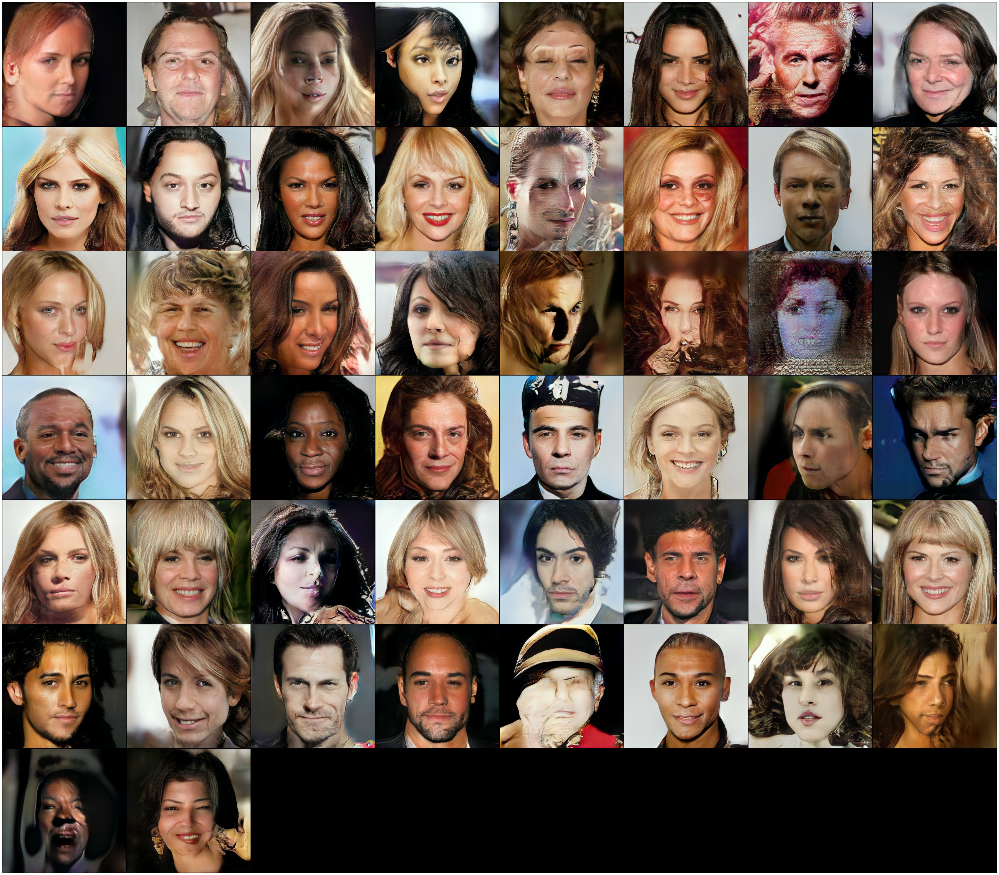

ValueError: ignored

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision

# uniform interpolation between two points in latent space
def interpolate_points(p1, p2, n_steps=10):
	# interpolate ratios between the points
	ratios = np.linspace(0, 1, num=n_steps)
	# linear interpolate vectors
	vectors = list()
	for ratio in ratios:
		v = (1.0 - ratio) * p1 + ratio * p2
		vectors.append(v)
	return np.asarray(vectors).astype(np.float32)
 
def interpolate_noise(p1, p2, n_steps=10):
  return interpolate_points(p1, p2, n_steps)

num_images = 50
noise, _ = model.buildNoiseData(num_images)
noise_np = noise.cpu().numpy()
inter_noise = interpolate_noise(noise_np[0], noise_np[1], 1260)

"""
np_noise = np.random.rand(4, 512)
np_noise = np_noise.astype(np.float32)
noise = torch.from_numpy(np_noise)
"""

print(type(noise))
print(noise.shape)
print(noise.dtype)
print(noise)

print(type(inter_noise))
print(inter_noise.shape)
print(inter_noise.dtype)
print(inter_noise)

def show_images(input_noise):
  with torch.no_grad():
      generated_images = model.test(input_noise)

  grid = torchvision.utils.make_grid(generated_images.clamp(min=-1, max=1), scale_each=True, normalize=True)
  im_data = grid.permute(1, 2, 0).cpu().numpy()

  dpi = 80
  height, width, depth = im_data.shape

  # What size does the figure need to be in inches to fit the image?
  figsize = width / float(dpi), height / float(dpi)

  # Create a figure of the right size with one axes that takes up the full figure
  fig = plt.figure(figsize=figsize)
  ax = fig.add_axes([0, 0, 1, 1])

  # Hide spines, ticks, etc.
  ax.axis('off')
  ax.imshow(im_data)
  plt.show()
  return generated_images

show_images(noise)
output = np.zeros((1260, 512), dtype=np.float32)
for inter_input[:,:, np.newaxis] in inter_noise:
    inter_input = torch.from_numpy(inter_input)
    with torch.no_grad():
      generated_images = model.test(inter_input)
      output[:,:,]

# Principal Component Analysis
U, S, V = torch.pca_lowrank(noise, q=8, center=True, niter=20)
pca = torch.matmul(noise, V[:, :8]).numpy()
print(pca.shape)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# normalize pca
row_maxs = pca.max(axis=1)
row_mins = pca.min(axis=1)
n_pca = (pca - row_mins[:, np.newaxis]) / (row_maxs[:, np.newaxis] - row_mins[:, np.newaxis])
print(n_pca)
# converting output to images and saving them
from torchvision.utils import save_image
import pandas as pd

tensor_2_image = torchvision.transforms.ToPILImage() # Converts to Image
file_names = []

for i, batch in enumerate(output):
  image_name = "latentspace" + str(i) + ".png"
  file_names.append(image_name)
  path = "/content/drive/MyDrive/latentspace/" + image_name
  save_image(batch, path)

d = {'filename': file_names, 'pca': [entry for entry in n_pca]}
df = pd.DataFrame(data=d)
print(pca)
df.to_pickle("/content/drive/MyDrive/latentspace/latentspace.pkl")

[[0.28622496 0.26995105 0.         0.24204329 0.47899926 0.68397886
  1.         0.3214256 ]
 [0.867499   0.36489066 0.25009063 1.         0.5043328  0.
  0.83371836 0.72315484]
 [0.46361473 1.         0.30335912 0.47177714 0.1622937  0.
  0.31129876 0.04865118]
 [0.         0.5234064  0.40668377 0.611324   0.965378   0.4447712
  0.34470713 1.        ]
 [0.         1.         0.43568125 0.30067793 0.34298187 0.30421615
  0.42785648 0.21401179]
 [0.13820703 0.0280695  1.         0.8828956  0.6737182  0.52864194
  0.514911   0.        ]
 [1.         0.29146558 0.00274676 0.577793   0.7958806  0.61110026
  0.         0.21352339]
 [0.41217983 0.5035484  0.4146812  0.6727304  0.         1.
  0.28731143 0.6330921 ]
 [0.9504616  0.6067725  1.         0.         0.84120244 0.67028004
  0.62413734 0.7051707 ]
 [0.7795844  0.09890773 1.         0.52937603 0.         0.26313105
  0.66955286 0.95254165]]
[[ -2.4550939   -2.8746247   -9.833794    -3.5940695    2.5145068
    7.7987523   15.945579   

,filename,pca
0,latentspace0.png,"[0.28622496, 0.26995105, 0.0, 0.24204329, 0.47..."
1,latentspace1.png,"[0.867499, 0.36489066, 0.25009063, 1.0, 0.5043..."
2,latentspace2.png,"[0.46361473, 1.0, 0.30335912, 0.47177714, 0.16..."
3,latentspace3.png,"[0.0, 0.5234064, 0.40668377, 0.611324, 0.96537..."
4,latentspace4.png,"[0.0, 1.0, 0.43568125, 0.30067793, 0.34298187,..."
5,latentspace5.png,"[0.13820703, 0.028069502, 1.0, 0.8828956, 0.67..."
6,latentspace6.png,"[1.0, 0.29146558, 0.0027467613, 0.577793, 0.79..."
7,latentspace7.png,"[0.41217983, 0.5035484, 0.4146812, 0.6727304, ..."
8,latentspace8.png,"[0.9504616, 0.6067725, 1.0, 0.0, 0.84120244, 0..."
9,latentspace9.png,"[0.7795844, 0.09890773, 1.0, 0.52937603, 0.0, ..."


### Model Description

In computer vision, generative models are networks trained to create images from a given input. In our case, we consider a specific kind of generative networks: GANs (Generative Adversarial Networks) which learn to map a random vector with a realistic image generation.

Progressive Growing of GANs is a method developed by Karras et. al. [1] in 2017 allowing generation of high resolution images. To do so, the generative network is trained slice by slice. At first the model is trained to build very low resolution images, once it converges, new layers are added and the output resolution doubles. The process continues until the desired resolution is reached.

### Requirements

- Currently only supports Python 3

### References

- [Progressive Growing of GANs for Improved Quality, Stability, and Variation](https://arxiv.org/abs/1710.10196)